<a href="https://colab.research.google.com/github/garkul/Transcriptomics.msu/blob/master/HW_15.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>Домашнее задание 15</h1>
<h3> Гаркуль Лидия 4 курс ФББ</h3>
<b>Задания:</b><br>
1. Попробуйте запустить MOFA с меньшим числом факторов (например, 10, как указано по умолчанию). Что поменялось?<br>
2. Попробуйте запустить MOFA на одной модальности (например, только на РНК). Сравните получившиеся результаты с PCA. Сходятся ли результаты?<br>
3.Попробуйте запустить WNN без L2-нормализации PCA в начале. Что-то поменялось? Какой результат, на ваш взгляд, лучше?

###Установка необходимых пакетов и программ

In [ ]:
# Установка необходимых пакетов
!pip install scanpy[leiden] muon scikit-misc harmonypy mofapy2

# Необходимо, чтобы конкретно прогрузился matplotlib
import os
os.kill(os.getpid(), 9)

In [ ]:
# Загрузка необходимых датасетов

## CITE-Seq
!wget https://ftp.ncbi.nlm.nih.gov/geo/series/GSE194nnn/GSE194122/suppl/GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz
!gunzip GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz

--2022-12-28 22:00:59--  https://ftp.ncbi.nlm.nih.gov/geo/series/GSE194nnn/GSE194122/suppl/GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz
Resolving ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)... 130.14.250.10, 130.14.250.12, 2607:f220:41e:250::13, ...
Connecting to ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)|130.14.250.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 615842052 (587M) [application/x-gzip]
Saving to: ‘GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz.1’

GSE194122_openprobl 100%[===================>] 587.31M  80.1MB/s    in 8.0s    

2022-12-28 22:01:07 (73.8 MB/s) - ‘GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz.1’ saved [615842052/615842052]

gzip: GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad already exists; do you wish to overwrite (y or n)? n
	not overwritten


In [ ]:
# Подгрузка необходимых библиотек
import scanpy as sc
import muon as mu
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

sc.set_figure_params(dpi=150)

In [ ]:
# Вспомогательная функция, чтобы создать объект
def create_MuData(adata, var_key="feature_types", layer="counts", batch_key="batch",
                  obs_columns=["cell_type", "batch"], batches=["s1d1", "s2d4"]):
  mdata = {}
  for mod in set(adata.var[var_key]):
    if layer == "X":
      X = adata[np.isin(adata.obs[batch_key], batches), adata.var[var_key] == mod].X
    else:
      X = adata[np.isin(adata.obs[batch_key], batches), adata.var[var_key] == mod].layers[layer]
    mdata[mod] = sc.AnnData(X=X, obs=adata[np.isin(adata.obs[batch_key], batches)].obs[obs_columns],
                            var=pd.DataFrame(index=f"{mod}_" + adata.var_names[adata.var[var_key] == mod]))
    mdata[mod].var_names_make_unique()
  mdata = mu.MuData(mdata)
  return mdata

# Чтение датасета CITE-Seq
adata_cite = sc.read_h5ad("GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad")
mdata = create_MuData(adata_cite)
del adata_cite

mdata["GEX"].layers["counts"] = mdata["GEX"].X.copy()
mdata["ADT"].layers["counts"] = mdata["ADT"].X.copy()

/usr/local/lib/python3.8/dist-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


###Повторение семинара

Модальность РНК. <br>
Без батч-коррекции

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


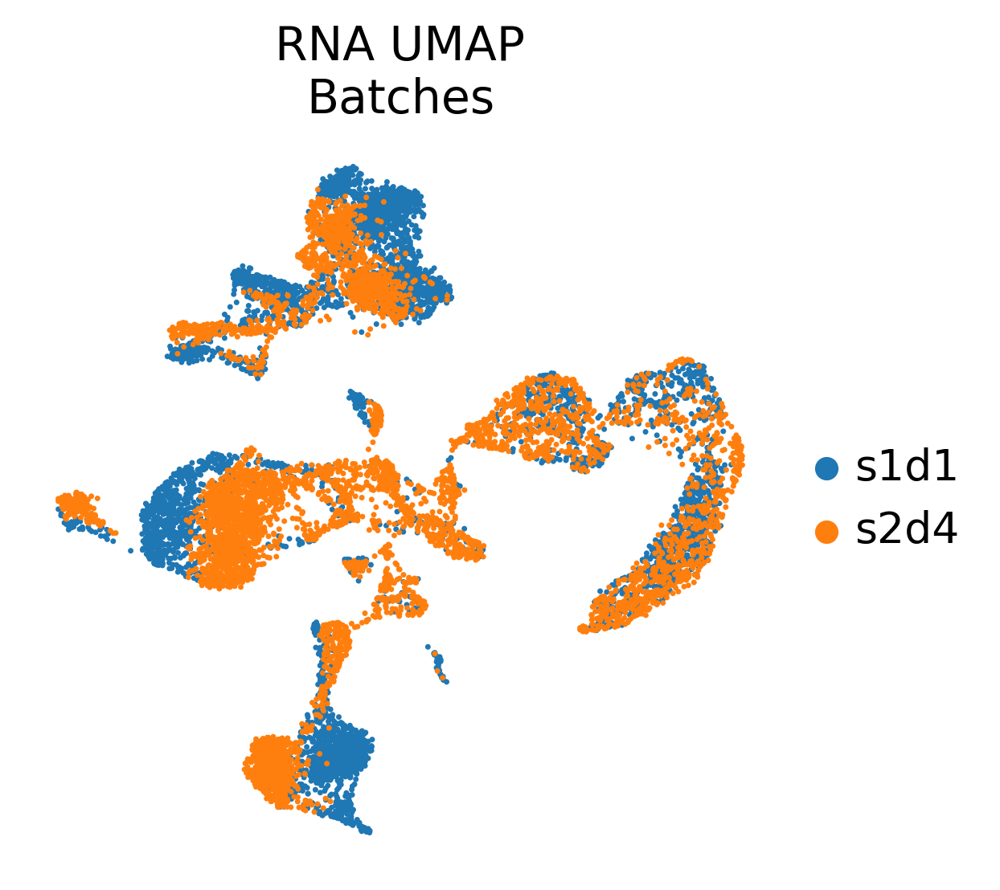

In [ ]:
# Убедимся, что в `adata.X` лежат каунты
mdata["GEX"].X = mdata["GEX"].layers["counts"].copy()

# Нормализация
sc.pp.normalize_total(mdata["GEX"])
sc.pp.log1p(mdata["GEX"])

# Выделение HVG
sc.pp.highly_variable_genes(mdata["GEX"], n_top_genes=3000,
                            flavor="seurat_v3", layer="counts")

# PCA
sc.pp.scale(mdata["GEX"], max_value=10)
sc.tl.pca(mdata["GEX"], n_comps=30)

# kNN-граф
sc.pp.neighbors(mdata["GEX"], n_neighbors=20)

# UMAP
sc.tl.umap(mdata["GEX"])
sc.pl.umap(mdata["GEX"], color="batch", frameon=False,
           title="RNA UMAP\nBatches")

С батч-коррекцией

2022-12-28 22:10:16,243 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-28 22:10:21,905 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-28 22:10:21,993 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-28 22:10:25,692 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-28 22:10:28,512 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-28 22:10:31,296 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-28 22:10:34,080 - harmonypy - INFO - Converged after 4 iterations
INFO:harmonypy:Converged after 4 iterations
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


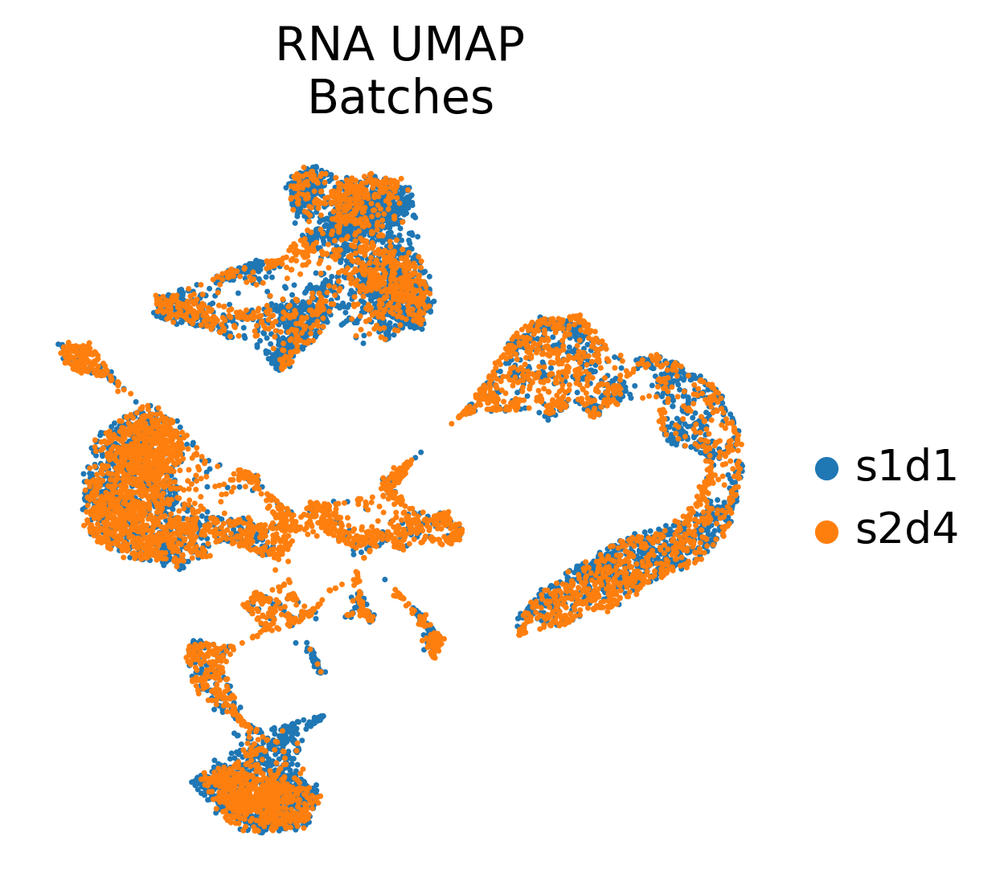

In [ ]:
# Коррекция батч-эффекта при помощи harmony
import scanpy.external as sce

# Убедимся, что в `adata.X` лежат каунты
mdata["GEX"].X = mdata["GEX"].layers["counts"].copy()

# Нормализация
sc.pp.normalize_total(mdata["GEX"], target_sum=1e4)
sc.pp.log1p(mdata["GEX"])

# Выделение HVG
sc.pp.highly_variable_genes(mdata["GEX"], n_top_genes=3000,
                            flavor="seurat_v3", layer="counts",
                            batch_key="batch")

# PCA и Harmony
mdata["GEX"].raw = mdata["GEX"]
sc.pp.scale(mdata["GEX"], max_value=10)
sc.tl.pca(mdata["GEX"], n_comps=30)
sce.pp.harmony_integrate(mdata["GEX"], key="batch", max_iter_harmony=20)

# kNN-граф
sc.pp.neighbors(mdata["GEX"], n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
sc.tl.umap(mdata["GEX"])
sc.pl.umap(mdata["GEX"], color="batch", frameon=False,
           title="RNA UMAP\nBatches")

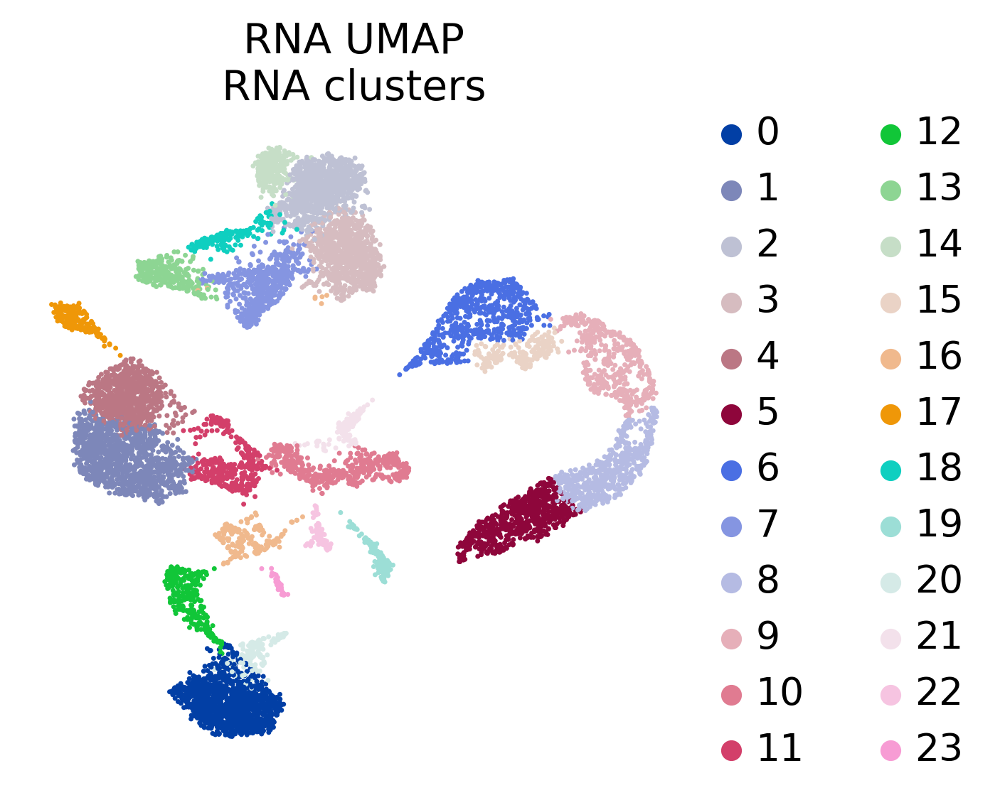

In [ ]:
# Кластеризация
sc.tl.leiden(mdata["GEX"], resolution=1)
sc.pl.umap(mdata["GEX"], color="leiden", frameon=False, 
           title="RNA UMAP\nRNA clusters")

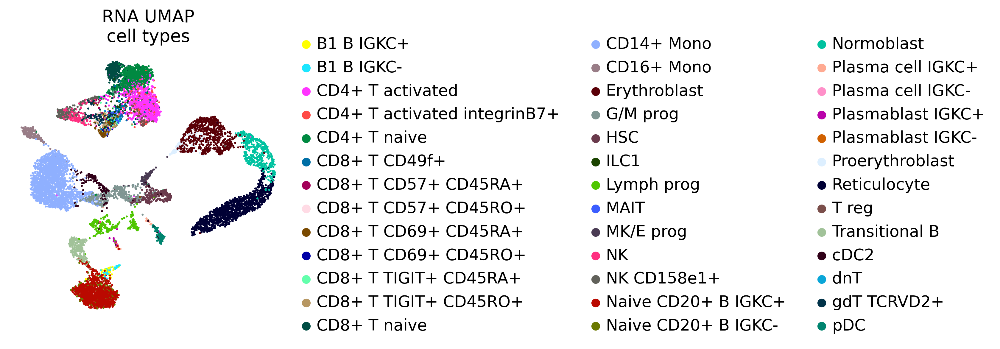

In [ ]:
sc.pl.umap(mdata["GEX"], color="cell_type", frameon=False, 
           title="RNA UMAP\ncell types")

Модельность ADT. <br>
Без батч-коррекции

/usr/local/lib/python3.8/dist-packages/muon/_prot/preproc.py:214: UserWarning: adata.X is sparse but not in CSC format. Converting to CSC.
  warn("adata.X is sparse but not in CSC format. Converting to CSC.")
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


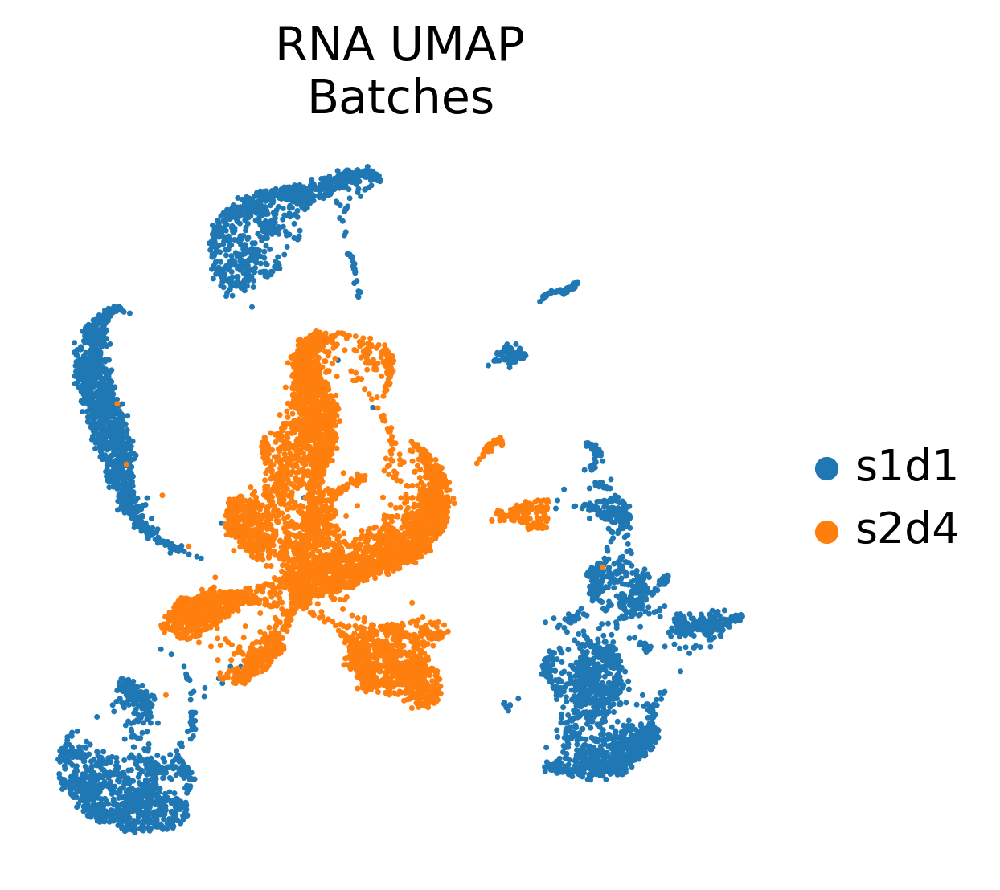

In [ ]:
# Убедимся, что в `adata.X` лежат каунты
mdata["ADT"].X = mdata["ADT"].layers["counts"].copy()

# CLR
mu.prot.pp.clr(mdata["ADT"])

# Все наши переменные считаем HVG
mdata["ADT"].var["highly_variable"] = True

# PCA
sc.pp.scale(mdata["ADT"], max_value=10)
sc.tl.pca(mdata["ADT"])

# kNN-граф
sc.pp.neighbors(mdata["ADT"], n_pcs=30, n_neighbors=20)

# UMAP
sc.tl.umap(mdata["ADT"])
sc.pl.umap(mdata["ADT"], color="batch", frameon=False,
           title="RNA UMAP\nBatches")

С батч-коррекцией

/usr/local/lib/python3.8/dist-packages/muon/_prot/preproc.py:214: UserWarning: adata.X is sparse but not in CSC format. Converting to CSC.
  warn("adata.X is sparse but not in CSC format. Converting to CSC.")
2022-12-28 22:11:00,623 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-28 22:11:08,133 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-28 22:11:08,225 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-28 22:11:11,149 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-28 22:11:14,100 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-28 22:11:17,072 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-28 22:11:20,062 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-2

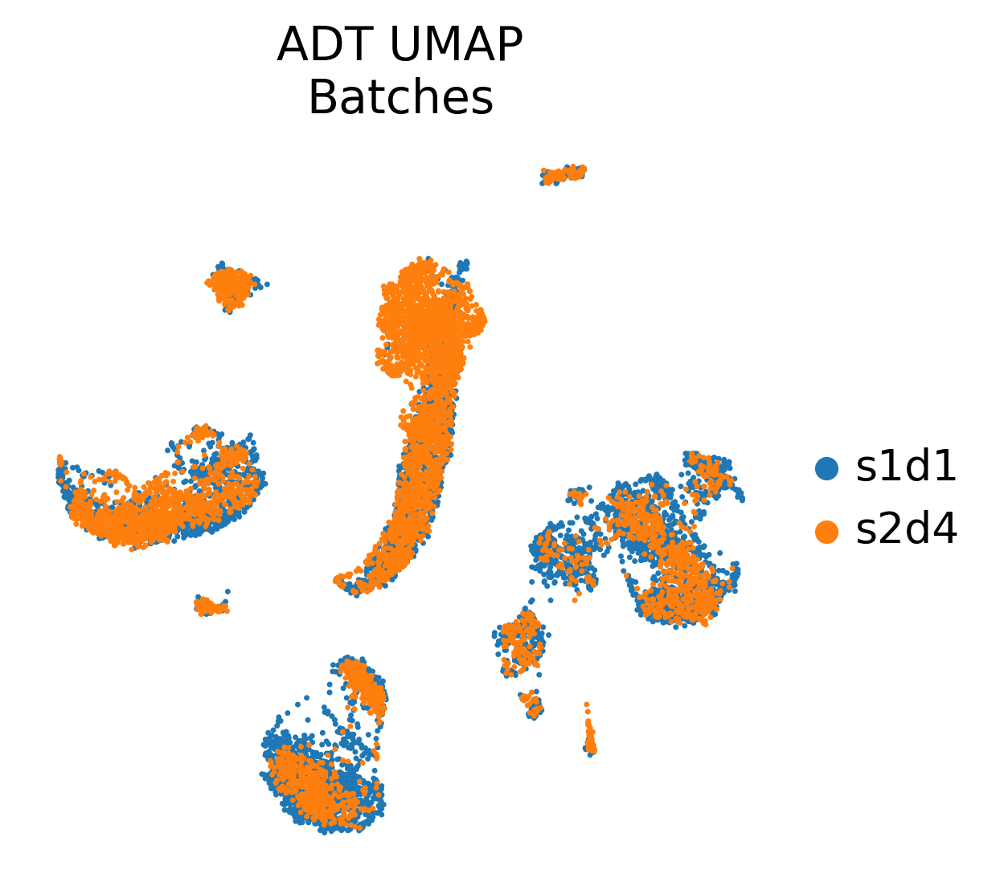

In [ ]:
# Убедимся, что в `adata.X` лежат каунты
mdata["ADT"].X = mdata["ADT"].layers["counts"].copy()

# CLR
mu.prot.pp.clr(mdata["ADT"])

# Все наши переменные считаем HVG
mdata["ADT"].var["highly_variable"] = True

# PCA
mdata["ADT"].raw = mdata["ADT"]
sc.pp.scale(mdata["ADT"], max_value=10)
sc.tl.pca(mdata["ADT"])
sce.pp.harmony_integrate(mdata["ADT"], key="batch", max_iter_harmony=20)

# kNN-граф
sc.pp.neighbors(mdata["ADT"], n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
sc.tl.umap(mdata["ADT"])
sc.pl.umap(mdata["ADT"], color="batch", frameon=False,
           title="ADT UMAP\nBatches")

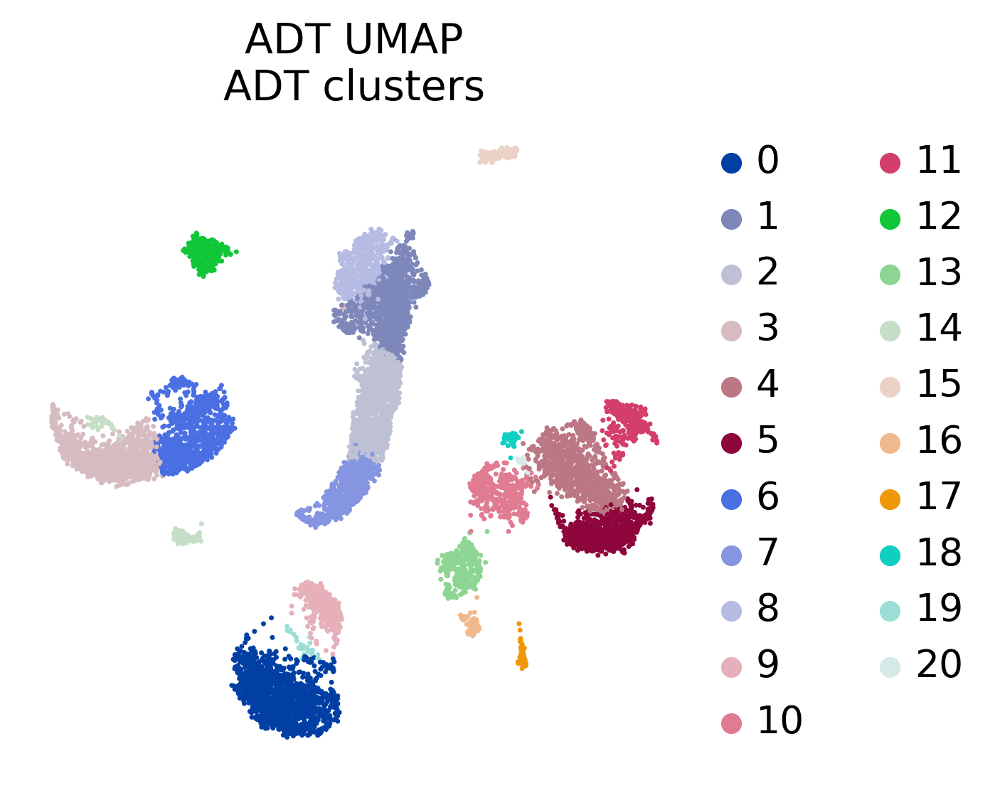

In [ ]:
sc.tl.leiden(mdata["ADT"], resolution=1)
sc.pl.umap(mdata["ADT"], color="leiden", frameon=False,
           title="ADT UMAP\nADT clusters")

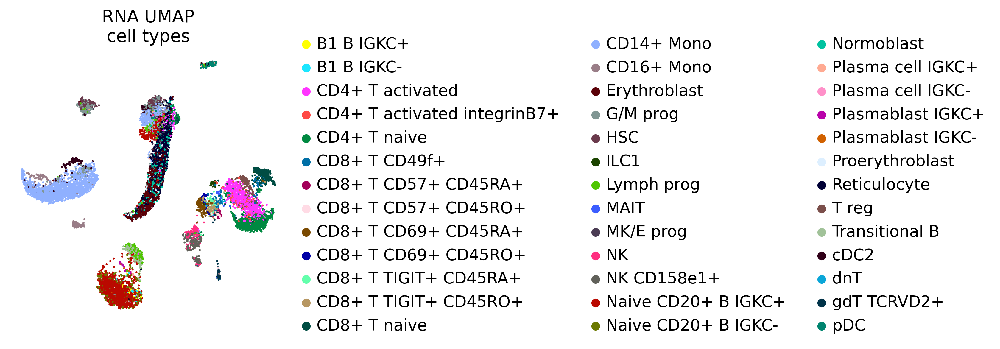

In [ ]:
sc.pl.umap(mdata["ADT"], color="cell_type", frameon=False, 
           title="RNA UMAP\ncell types")

Поддержка различных модальностей

In [ ]:
sc.tl.leiden(mdata["GEX"], resolution=0.5)
sc.tl.leiden(mdata["ADT"], resolution=0.5)

mdata.obs["ADT:leiden"] = mdata["ADT"].obs["leiden"].copy()
mdata.obs["GEX:leiden"] = mdata["GEX"].obs["leiden"].copy()

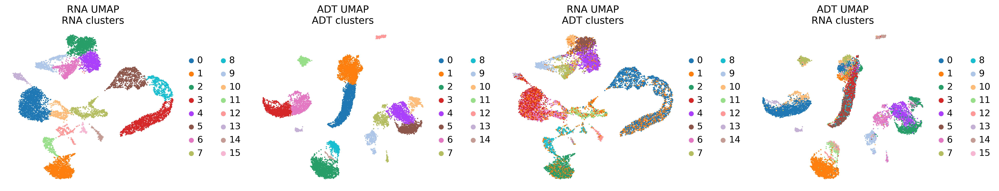

In [ ]:
fig, axes = plt.subplots(figsize=(20, 4), ncols=4)

mu.pl.embedding(mdata, basis="GEX:X_umap", color="GEX:leiden",
                frameon=False, title="RNA UMAP\nRNA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="ADT:leiden",
                frameon=False, title="ADT UMAP\nADT clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="GEX:X_umap", color="ADT:leiden",
                frameon=False, title="RNA UMAP\nADT clusters", ax=axes[2],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="GEX:leiden",
                frameon=False, title="ADT UMAP\nRNA clusters", ax=axes[3],
                show=False)

fig.tight_layout()

 MOFA

In [ ]:
# Запуск MOFA
mu.tl.mofa(mdata, n_factors=30, groups_label="GEX:batch")


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
Loaded view='GEX' group='s1d1' with N=5227 samples and D=13953 features...
Loaded view='GEX' group='s2d4' with N=5584 samples and D=13953 features...
Loaded view='ADT' group='s1d1' with N=5227 samples and D=134 features...
Loaded view='ADT' group='s2d4' with N=5584 samples and D=134 features...


Model options:
- Automatic Relevance Determination prior on the factors: True
- Aut

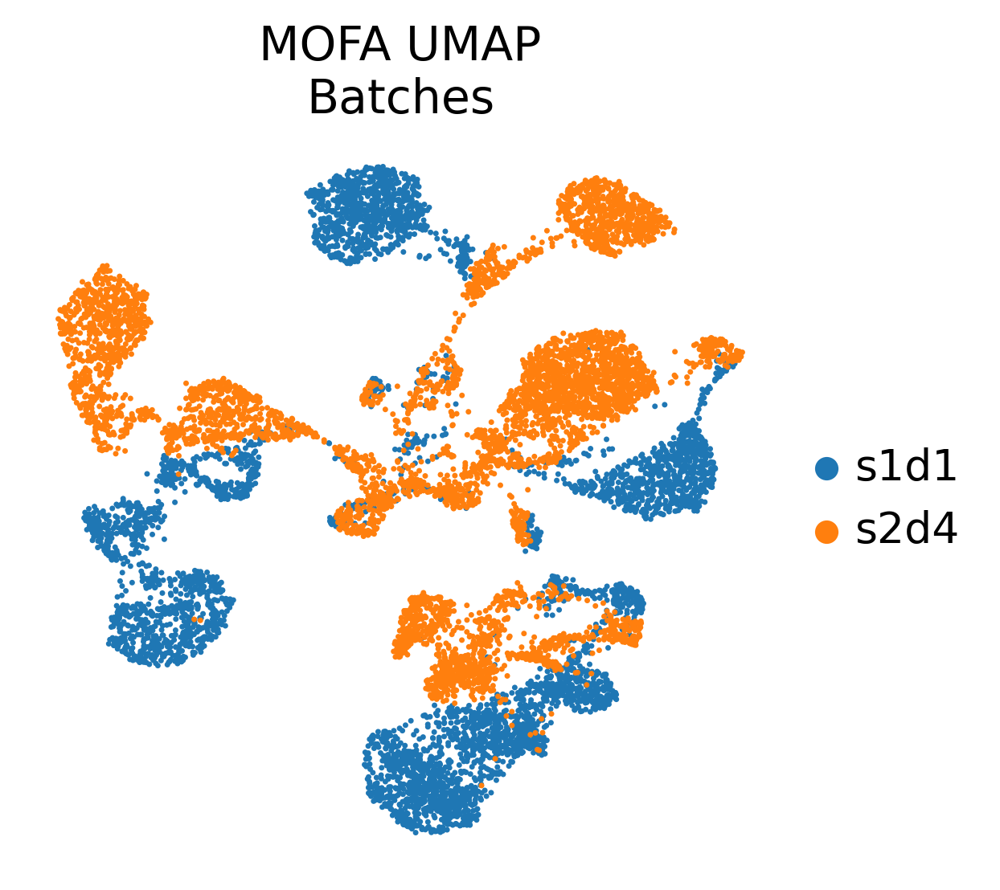

In [ ]:
# kNN-граф
sc.pp.neighbors(mdata, use_rep="X_mofa", n_neighbors=20)

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

2022-12-28 22:25:21,298 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-28 22:25:27,255 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-28 22:25:27,346 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-28 22:25:30,973 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-28 22:25:33,840 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-28 22:25:36,578 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-28 22:25:39,503 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-28 22:25:42,297 - harmonypy - INFO - Iteration 6 of 20
INFO:harmonypy:Iteration 6 of 20
2022-12-28 22:25:44,181 - harmonypy - INFO - Iteration 7 of 20
INFO:harmonypy:Iteration 7 of 20
2022-12-28 22:25:45,151 - 

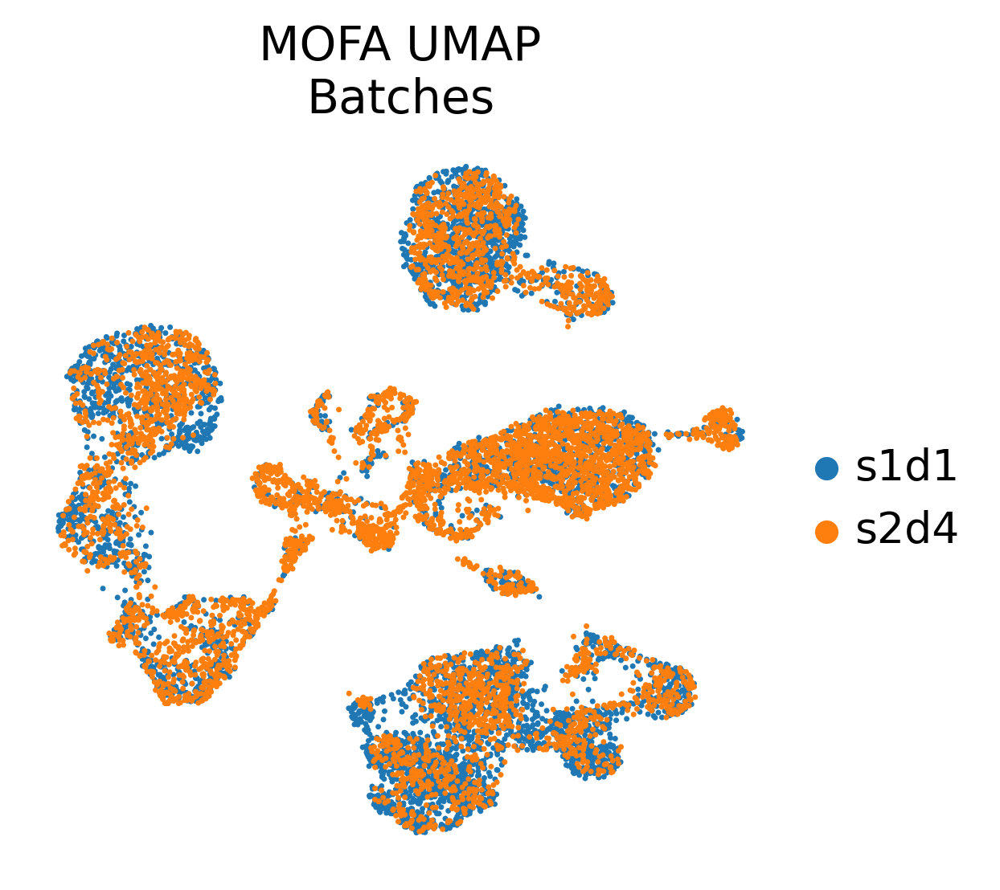

In [ ]:
# Harmony
sce.pp.harmony_integrate(mdata, key="GEX:batch", max_iter_harmony=20, basis="X_mofa")

# kNN-граф
sc.pp.neighbors(mdata, n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

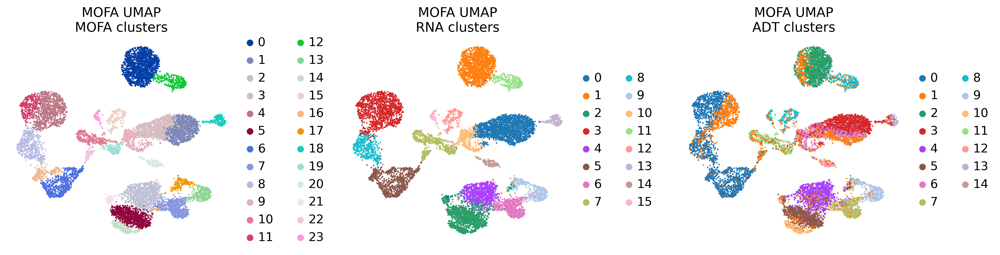

In [ ]:
# кластеризация
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="leiden",
                frameon=False, title="MOFA UMAP\nMOFA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:leiden",
                frameon=False, title="MOFA UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

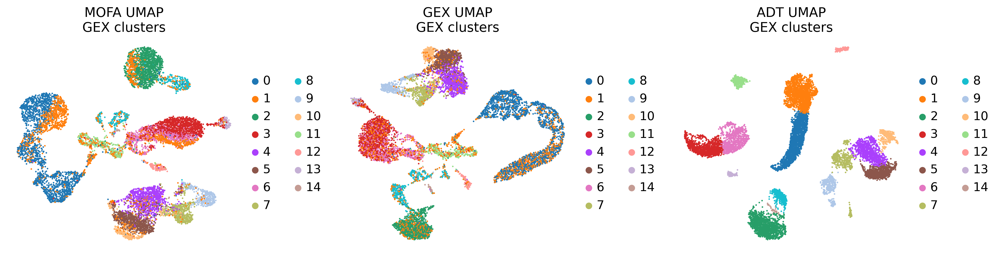

In [ ]:
# кластеризация
fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nGEX clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="GEX:X_umap", color="ADT:leiden",
                frameon=False, title="GEX UMAP\nGEX clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="ADT:leiden",
                frameon=False, title="ADT UMAP\nGEX clusters", ax=axes[2],
                show=False)
fig.tight_layout()

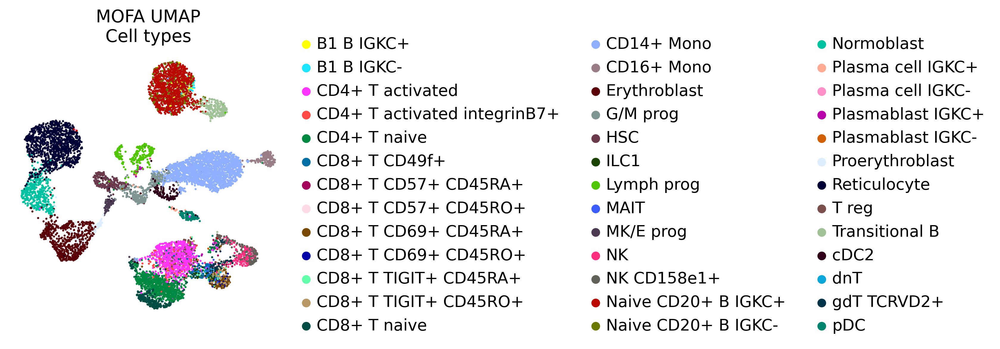

In [ ]:
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:cell_type",
                frameon=False, title="MOFA UMAP\nCell types",)

###Попробуйте запустить MOFA с меньшим числом факторов (например, 10, как указано по умолчанию). Что поменялось?

In [ ]:
mu.tl.mofa(mdata, groups_label="GEX:batch")


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
Loaded view='GEX' group='s1d1' with N=5227 samples and D=13953 features...
Loaded view='GEX' group='s2d4' with N=5584 samples and D=13953 features...
Loaded view='ADT' group='s1d1' with N=5227 samples and D=134 features...
Loaded view='ADT' group='s2d4' with N=5584 samples and D=134 features...


Model options:
- Automatic Relevance Determination prior on the factors: True
- Aut

In [ ]:
# kNN-граф
sc.pp.neighbors(mdata, use_rep="X_mofa", n_neighbors=20)

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

In [ ]:
# Harmony
sce.pp.harmony_integrate(mdata, key="GEX:batch", max_iter_harmony=20, basis="X_mofa")

# kNN-граф
sc.pp.neighbors(mdata, n_pcs=10, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

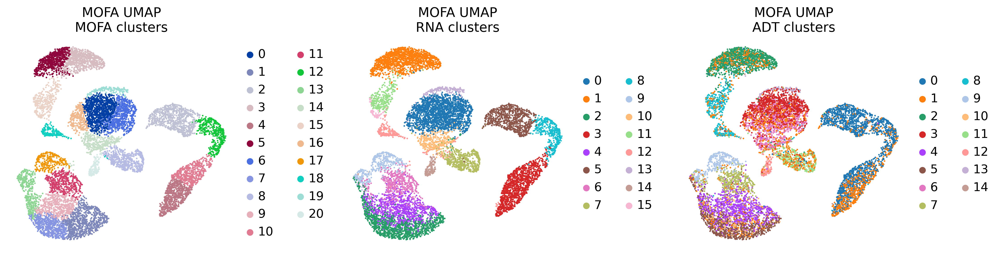

In [ ]:
# кластеризация
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="leiden",
                frameon=False, title="MOFA UMAP\nMOFA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:leiden",
                frameon=False, title="MOFA UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

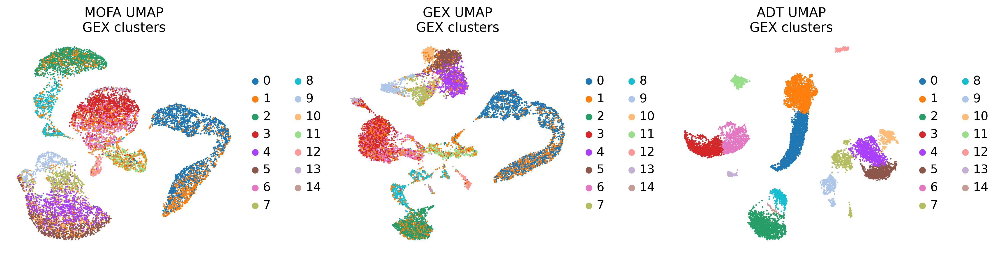

In [ ]:
# кластеризация
fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nGEX clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="GEX:X_umap", color="ADT:leiden",
                frameon=False, title="GEX UMAP\nGEX clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="ADT:leiden",
                frameon=False, title="ADT UMAP\nGEX clusters", ax=axes[2],
                show=False)
fig.tight_layout()

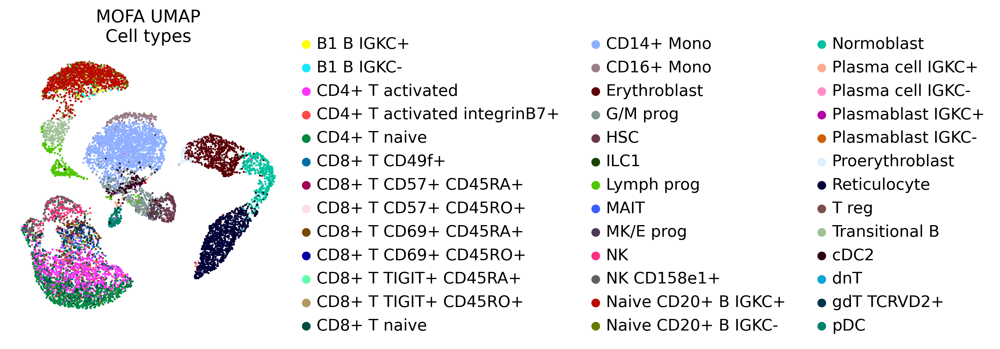

In [ ]:
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:cell_type",
                frameon=False, title="MOFA UMAP\nCell types",)

<b>Выводы:</b> Количество кластеров уменьшилось.

###Cеминар. Продолжение

WNN

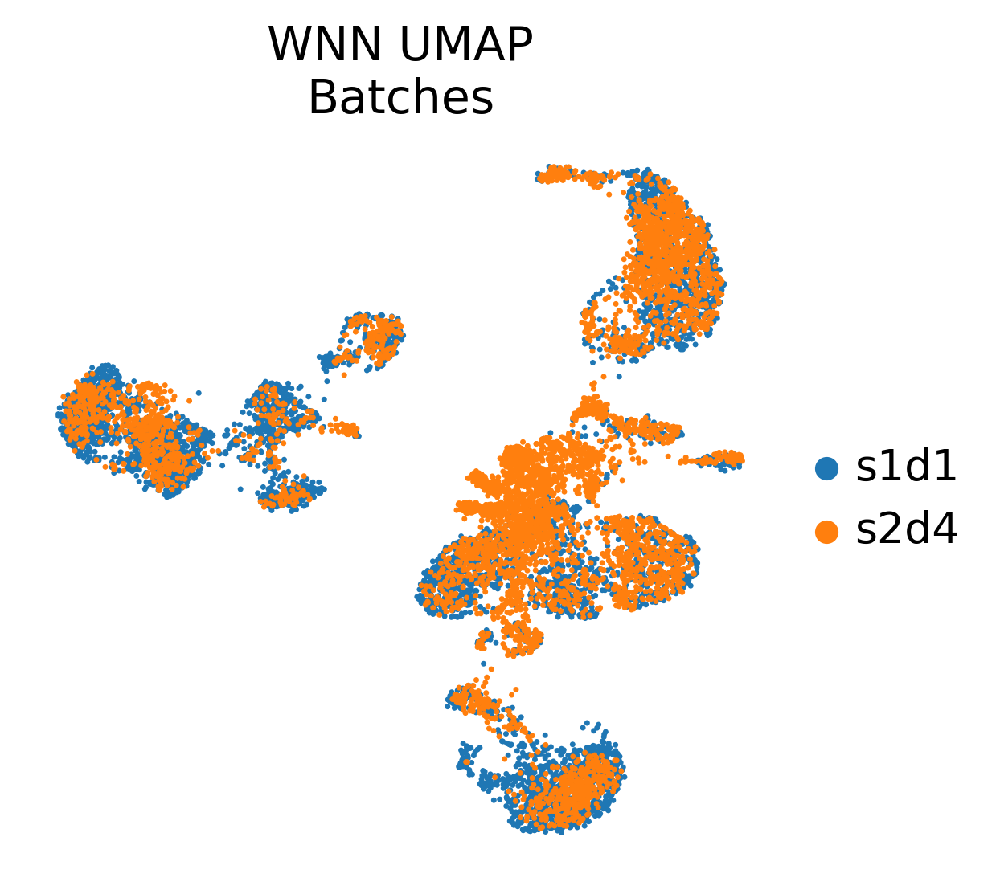

In [ ]:
# L2-нормализация PCA
mu.pp.l2norm(mdata, rep="X_pca_harmony")

# Построение графа соседей на L2-отнормированных PCs
sc.pp.neighbors(mdata["GEX"], n_neighbors=20, n_pcs=30, use_rep="X_pca_harmony")
sc.pp.neighbors(mdata["ADT"], n_neighbors=20, n_pcs=30, use_rep="X_pca_harmony")

# Построение WNN
mu.pp.neighbors(mdata)
mdata.obsm["X_umap_WNN"] = mu.tl.umap(mdata, copy=True).obsm["X_umap"].copy()

sc.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:batch", frameon=False,
                title="WNN UMAP\nBatches")

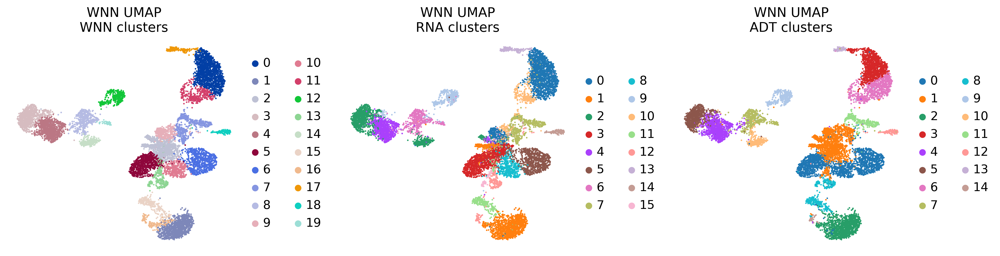

In [ ]:
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="leiden",
                frameon=False, title="WNN UMAP\nWNN clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:leiden",
                frameon=False, title="WNN UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="ADT:leiden",
                frameon=False, title="WNN UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

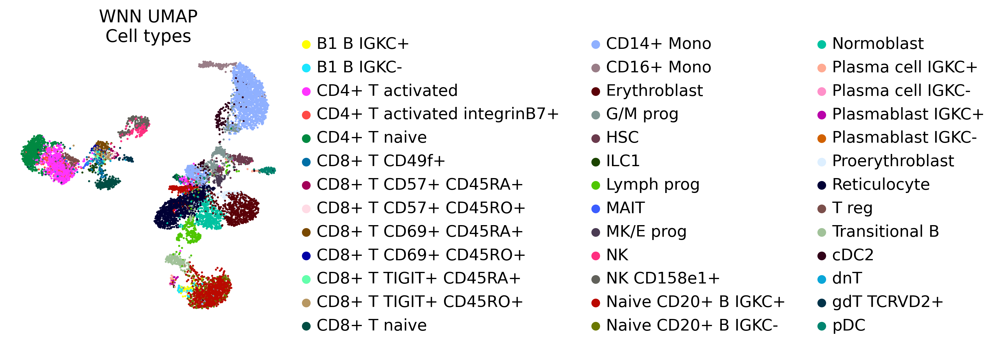

In [ ]:
mu.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:cell_type",
                frameon=False, title="WNN UMAP\nCell types",)


PCA concatenation


2022-12-28 21:25:58,363 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-28 21:26:04,313 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-28 21:26:17,859 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-28 21:26:21,226 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.


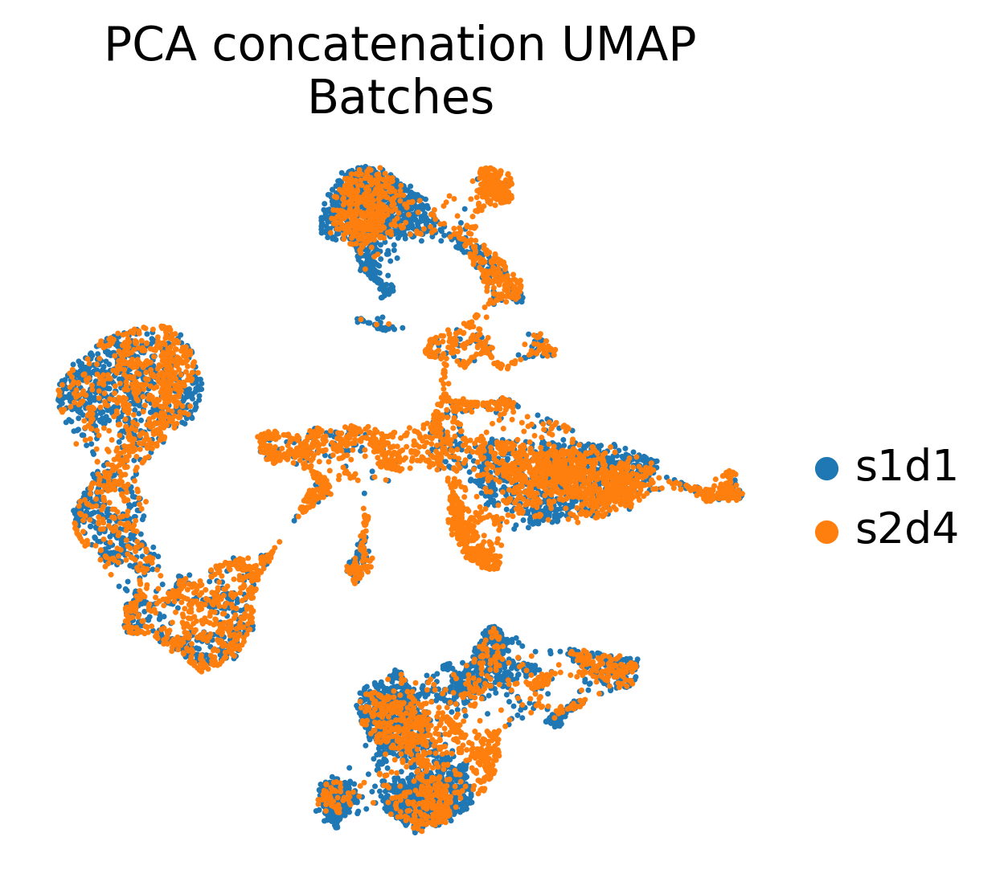

In [ ]:
sc.tl.pca(mdata["GEX"], n_comps=30)
sc.tl.pca(mdata["ADT"], n_comps=20)

sce.pp.harmony_integrate(mdata["GEX"], key="batch", max_iter_harmony=20, verbose=False)
sce.pp.harmony_integrate(mdata["ADT"], key="batch", max_iter_harmony=20, verbose=False)

mu.pp.l2norm(mdata, rep="X_pca_harmony")
mdata.obsm["X_pca_harmony"] = np.hstack([mdata["GEX"].obsm["X_pca_harmony"], mdata["ADT"].obsm["X_pca_harmony"]])

sc.pp.neighbors(mdata, n_neighbors=20, n_pcs=50, use_rep="X_pca_harmony")
mdata.obsm["X_umap_PCAconcat"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()

sc.pl.embedding(mdata, basis="X_umap_PCAconcat", color="GEX:batch", frameon=False,
                title="PCA concatenation UMAP\nBatches")

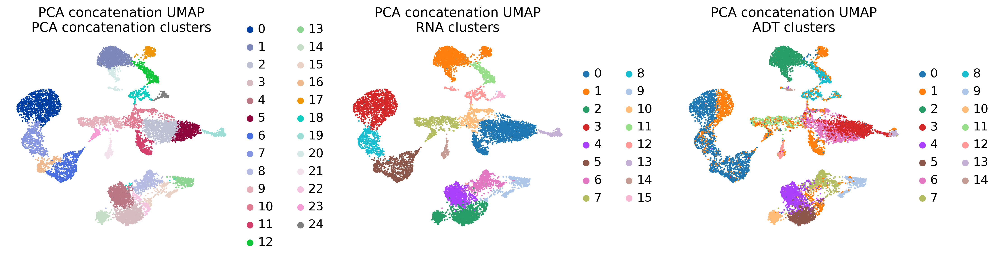

In [ ]:
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="leiden",
                frameon=False, title="PCA concatenation UMAP\nPCA concatenation clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="GEX:leiden",
                frameon=False, title="PCA concatenation UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="ADT:leiden",
                frameon=False, title="PCA concatenation UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

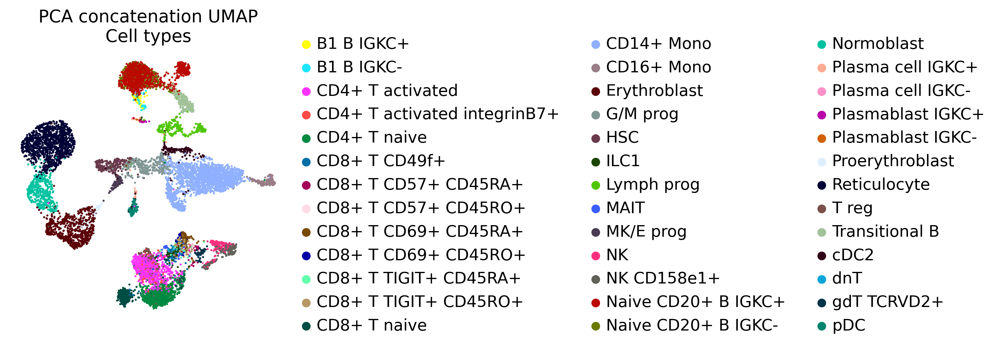

In [ ]:
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="GEX:cell_type",
                frameon=False, title="PCA concatenation UMAP\nCell types")

###Попробуйте запустить MOFA на одной модальности (например, только на РНК). Сравните получившиеся результаты с PCA. Сходятся ли результаты?

In [31]:
mdata["GEX"].X = mdata["GEX"].layers["counts"].copy()
mdata

MuData object with n_obs × n_vars = 10811 × 14087
  obs:	'leiden'
  obsm:	'X_mofa', 'X_umap_MOFA', 'X_pca_harmony'
  varm:	'LFs'
  obsp:	'distances', 'connectivities'
  2 modalities
    GEX:	10811 x 13953
      obs:	'cell_type', 'batch', 'leiden'
      var:	'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std', 'highly_variable_nbatches'
      uns:	'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'batch_colors', 'leiden', 'leiden_colors', 'cell_type_colors', 'mofa'
      obsm:	'X_pca', 'X_umap', 'X_pca_harmony', 'X_mofa'
      varm:	'PCs', 'LFs'
      layers:	'counts'
      obsp:	'distances', 'connectivities'
    ADT:	10811 x 134
      obs:	'cell_type', 'batch', 'leiden'
      var:	'highly_variable', 'mean', 'std'
      uns:	'pca', 'neighbors', 'umap', 'batch_colors', 'leiden', 'leiden_colors', 'cell_type_colors'
      obsm:	'X_pca', 'X_umap', 'X_pca_harmony'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'distances', 'connectivities'

In [ ]:
mu.tl.mofa(mdata['GEX'], n_factors=30, groups_label="batch")


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
Loaded view='data' group='s1d1' with N=5227 samples and D=3000 features...
Loaded view='data' group='s2d4' with N=5584 samples and D=3000 features...


Model options:
- Automatic Relevance Determination prior on the factors: True
- Automatic Relevance Determination prior on the weights: True
- Spike-and-slab prior on the factors: False
- Spike-and-slab prior on the weights: True

In [28]:
# kNN-граф
sc.pp.neighbors(mdata, use_rep="X_mofa", n_neighbors=20)

In [29]:
# Harmony
sce.pp.harmony_integrate(mdata, key="GEX:batch", max_iter_harmony=20, basis="X_mofa")

# kNN-граф
sc.pp.neighbors(mdata, n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

2022-12-28 22:39:27,060 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-28 22:39:35,606 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-28 22:39:35,776 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-28 22:39:40,299 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-28 22:39:44,174 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-28 22:39:46,815 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-28 22:39:49,439 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-28 22:39:51,061 - harmonypy - INFO - Iteration 6 of 20
INFO:harmonypy:Iteration 6 of 20
2022-12-28 22:39:52,804 - harmonypy - INFO - Iteration 7 of 20
INFO:harmonypy:Iteration 7 of 20
2022-12-28 22:39:54,020 - 

ValueError: ignored

In [ ]:
# кластеризация
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="leiden",
                frameon=False, title="MOFA UMAP\nMOFA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:leiden",
                frameon=False, title="MOFA UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

In [ ]:
# кластеризация
fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nGEX clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="GEX:X_umap", color="ADT:leiden",
                frameon=False, title="GEX UMAP\nGEX clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="ADT:leiden",
                frameon=False, title="ADT UMAP\nGEX clusters", ax=axes[2],
                show=False)
fig.tight_layout()

In [ ]:
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:cell_type",
                frameon=False, title="MOFA UMAP\nCell types",)

###Попробуйте запустить WNN без L2-нормализации PCA в начале. Что-то поменялось? Какой результат, на ваш взгляд, лучше?